In [1]:
import sys

sys.path.append('..')

%load_ext autoreload
%autoreload 2

In [2]:
import utils.coco_generator as coco
import utils.doors_generator as doors
import utils.imagenet_generator as imagenet
import tensorflow as tf
import models

import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import keras.backend as K
import keras
import time
import cv2

from keras.backend.tensorflow_backend import set_session

%matplotlib inline

/scratch/home/aelphy/py27/local/lib/python2.7/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [3]:
import numpy as np
import OpenEXR
from PIL import Image
from pylab import cm
import matplotlib.colors as colors


def produce_jet(inputfile, outputfile):
    def convert(input):
        cmap = cm.jet
        cNorm  = colors.Normalize(vmin=0, vmax=0.5)
        m = cm.ScalarMappable(norm=cNorm, cmap=cmap)
        return Image.fromarray(np.uint8(m.to_rgba(input)*255))

    
    #inputfile = 'leicawh_patrol_04_wp_16_seq_00_20170704-depth.txt'
    f = open(inputfile,'r')
    L = []
    for line in f:
        L.append(line)

    cols = line.split(' ')
    num_cols = len(cols)
    if len(cols) % 2 == 1:
        num_cols -= 1

    f.close()

    corrected = np.zeros((len(L),num_cols))
    corrected = corrected.astype(np.float32)

    for i in range(len(L)):
        R = L[i].split(' ')
        res = [int(j) for j in R if j.isdigit()]
        corrected[i,:] = np.asarray(res) / 1000.0

    print corrected.min()
    print corrected.max()

    ll = (corrected == 0);
    corrected[np.where((corrected == 0))] = 100.1
    mn = corrected.min()
    corrected[np.where((corrected >= 100))] = mn

    corrected -= corrected.min()
    corrected /= corrected.max()

    print corrected.min()
    print corrected.max()
    print np.uint8(cm.jet(1.0)*255)
    print cm.jet(0.5)
    print cm.jet(0.0)

    im2 = convert(corrected)

    for i in range(num_cols):
        for j in range(len(L)):
            if ll[j,i]:
                im2.putpixel((i,j),(0,0,0))
    im2.save(outputfile)


In [4]:
import os.path as osp

'wednesday_nightlife/doors/leicawh_patrol_00_wp_01_seq_00_20180328-depth_jet.png'

In [49]:
fname_parts

'20180328-rgb.png'

In [5]:
with open('../share/docs/good_rgb_fixed.txt') as f:
    for line in f:
        parts = line.split()[0].split('/')
        fname_parts = parts[-1].split('_')
        old_fname = '_'.join(fname_parts[:-1] + [fname_parts[-1].split('-')[0] + '-depth']) + '.txt'
        new_fname = '_'.join(fname_parts[:-1] + [fname_parts[-1].split('-')[0] + '-depth_jet']) + '.png'
        produce_jet(osp.join('../data', '/'.join(parts[:-1]), old_fname), osp.join('../data', '/'.join(parts[:-1]), new_fname))

0.0
4.907
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.851
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.851
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.851
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.851
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.851
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.851
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.851
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.576
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
8.4
0.0
1.0
[0 0 0 ... 0

0.0
6.139
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
5.826
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
3.612
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
4.402
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
5.205
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
3.9
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
6.88
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
3.991
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
4.518
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
5.454
0.0
1.0
[0 0 0 ... 0 

0.0
9.851
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
1.489
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.617
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
4.704
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.851
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.077
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.028
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
7.824
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
1.822
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
3.501
0.0
1.0
[0 0 0 ...

0.0
2.129
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
5.728
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
1.882
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
4.291
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.851
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
1.515
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
3.33
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
6.368
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.315
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.414
0.0
1.0
[0 0 0 ... 

0.0
2.721
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
5.286
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.851
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.466
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.064
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
5.052
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
1.882
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.982
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.3
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
1.522
0.0
1.0
[0 0 0 ... 0

0.0
1.872
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.765
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.851
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
1.489
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.539
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
8.4
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.851
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.142
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.115
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
5.634
0.0
1.0
[0 0 0 ... 0

0.0
6.88
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
5.052
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
5.205
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
8.4
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
7.482
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
8.834
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
4.136
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
7.649
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.068
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.576
0.0
1.0
[0 0 0 ... 0 

0.0
2.115
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.858
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.851
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.448
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
1.862
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
1.872
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.851
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.851
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
1.496
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.851
0.0
1.0
[0 0 0 ...

0.0
2.24
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.765
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.851
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.016
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.658
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.811
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
1.515
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
4.291
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.169
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.851
0.0
1.0
[0 0 0 ... 

0.0
1.522
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.502
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
4.086
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.576
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.142
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
1.522
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.811
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.851
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.811
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.851
0.0
1.0
[0 0 0 ...

0.0
9.851
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
1.882
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.851
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
4.704
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.129
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
1.852
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.851
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
2.811
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
9.315
0.0
1.0
[0 0 0 ... 0 0 1]
(0.4901960784313725, 1.0, 0.4775458570524984, 1.0)
(0.0, 0.0, 0.5, 1.0)
0.0
1.852
0.0
1.0
[0 0 0 ...

In [19]:
TRAIN_DATA='/scratch/home/aelphy/projects/guardian/share/docs/'
IMG_FOLDER='/scratch/home/aelphy/projects/guardian/data'

In [9]:
%load_ext autoreload

%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [10]:
from load_door_data import load_doors

In [14]:
ls /scratch/home/aelphy/projects/guardian/share/docs/good_rgb_fixed.txt

/scratch/home/aelphy/projects/guardian/share/docs/good_rgb_fixed.txt


In [18]:
ls /scratch/home/aelphy/projects/guardian/data/doors/wednesday_nightlife/doors/

ls: cannot access '/scratch/home/aelphy/projects/guardian/data/doors/wednesday_nightlife/doors/': No such file or directory


In [21]:
Xn, yn, wpn = load_doors(256, 256, '', 'good_rgb_fixed', train_data=TRAIN_DATA, img_folder=IMG_FOLDER)
Xn_depth, yn, wpn_depths = load_doors(256, 256, '','good_depth_fixed', train_data=TRAIN_DATA, img_folder=IMG_FOLDER)

/scratch/home/aelphy/projects/guardian/data
/scratch/home/aelphy/projects/guardian/data


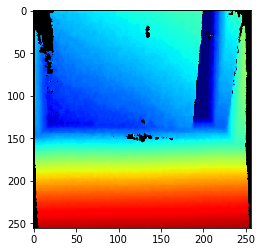

In [24]:
plt.imshow(Xn_depth[0])

In [25]:
BATCH_SIZE = 25

In [26]:
config = tf.ConfigProto()
# config.gpu_options.per_process_gpu_memory_fraction = 0.5

set_session(tf.Session(config=config))

# Build model from scratch

In [27]:
import models.siamese
model = models.siamese.build(
    (256, 256, 3), 1024, 128, 'vgg16'
)

# NOTE: doesn't work with keras
# model.compile(
#     loss=lambda y, x: tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=y, logits=x)),
#     optimizer=keras.optimizers.RMSprop(1e-5),
#     metrics=[]
# )

labels = tf.placeholder(tf.float32, name='labels')

loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=labels, logits=model.output))

global_step = tf.Variable(0, trainable=False)
train_step = tf.train.RMSPropOptimizer(1e-5).minimize(loss, global_step=global_step)
tf.add_to_collection('train_step', train_step)

sess = tf.Session()
sess.run(tf.global_variables_initializer())

input_1 = model.input[0]
input_2 = model.input[1]

# Write graph

In [5]:
graph_writer = tf.summary.FileWriter('../logs/', graph=tf.get_default_graph())
summary_writer = tf.summary.FileWriter('../logs/')
tf.summary.scalar('loss', loss)
merged = tf.summary.merge_all()

# Pretrain model

In [ ]:
# Imagenet
imagenet_headers = imagenet.load_headers_by_categories()
minibatch_generator = imagenet.MinibatchGenerator(imagenet_headers, BATCH_SIZE, 256, 256, positive='class').run()

# Coco
# coco_headers = coco.load_headers_by_categories()
# minibatch_generator = coco.MinibatchGenerator(coco_headers, BATCH_SIZE, 256, 256, positive='class').run()

In [ ]:
#train iter
for i in range(1000000):
    b_l, b_r, b_sim = minibatch_generator.next()

    _, l, summary = sess.run([train_step, loss, merged],
        feed_dict={input_1:b_l*255, input_2:b_r*255, labels: b_sim})
    
    summary_writer.add_summary(summary, i)

    if i % 100 == 0:
        print "\r#%d - Loss"%i, l
        
# for epoch in range(100):
#     x1, x2, y = minibatch_generator.next()
#     loss = model.train_on_batch([x1, x2], y)
#     print(loss)

# Load pretrained weights

In [28]:
with np.load('../weights/siamese_pretrained_imagenet.npz') as f:
    param_values = [f['arr_%d' % i] for i in range(len(f.files))][0]

In [29]:
def reset_model_to_pretrained_state():
    tf.reset_default_graph()
    global model
    global sess
    global train_step
    global loss
    global labels
    
    model = models.siamese.build(
        (256, 256, 3), 1024, 128, 'vgg16'
    )

    labels = tf.placeholder(tf.float32, name='labels')

    loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=labels, logits=model.output))

    global_step = tf.Variable(0, trainable=False)
    train_step = tf.train.RMSPropOptimizer(1e-5).minimize(loss, global_step=global_step)
    tf.add_to_collection('train_step', train_step)

    sess = tf.Session()
    sess.run(tf.global_variables_initializer())
    
    for i, var in enumerate(tf.trainable_variables()):
        sess.run(var.assign(param_values[i]))

In [30]:
def reset_fused_model_to_pretrained_state():
    tf.reset_default_graph()
    global model
    global sess
    global train_step
    global loss
    global labels
    
    model = models.siamese.build(
        (256, 256, 6), 1024, 128, 'vgg16'
    )

    labels = tf.placeholder(tf.float32, name='labels')

    loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=labels, logits=model.output))

    global_step = tf.Variable(0, trainable=False)
    train_step = tf.train.RMSPropOptimizer(1e-5).minimize(loss, global_step=global_step)
    tf.add_to_collection('train_step', train_step)

    sess = tf.Session()
    sess.run(tf.global_variables_initializer())
    
    for i, var in enumerate(tf.trainable_variables()[1:]):
        sess.run(var.assign(param_values[i + 1]))

# Load doors

In [35]:
sigmoid = lambda x: 1 / (1 + np.exp(-x))

def predict1(model, inputs):
    return sigmoid(sess.run(model.output, feed_dict={model.input[0] : inputs[0]*255, model.input[1] : inputs[1]*255}))


def predict2(model, inputs):
    return (sigmoid(sess.run(model.output, feed_dict={model.input[0] : inputs[0]*255, model.input[1] : inputs[1]*255})) > 0.5).astype(np.int64)

def do_test(test_img, label, g, predict):
    tets_metric1 = 0
    for batch in doors.test_iterate_minibatches(test_img, g.closed_reference_doors, BATCH_SIZE):
        tets_metric1 += predict(model, batch).sum()
    mean1 = tets_metric1 / len(g.closed_reference_doors)
    
    tets_metric2 = 0
    for batch in doors.test_iterate_minibatches(test_img, g.open_reference_doors, BATCH_SIZE):
        tets_metric2 += predict(model, batch).sum()
    mean2 = tets_metric2 / len(g.open_reference_doors)
    
    answer = np.argmin([mean1, mean2])
    
    return answer == label, (mean1, mean2), test_img

In [36]:
HAND_CRAFTED_PATH = '/scratch/home/aelphy/projects/guardian/data/doors_from_web/'
HAND_CRAFTED_ANNOTATION_PATH = '/scratch/home/aelphy/projects/guardian/data/hand_crafted_doors.txt'

In [10]:
Xc, Xd, y, wps = doors.load_data()

/scratch/home/aelphy/projects/guardian/data/doors/
/scratch/home/aelphy/projects/guardian/data/doors/
/scratch/home/aelphy/projects/guardian/data/doors/
/scratch/home/aelphy/projects/guardian/data/doors/
/scratch/home/aelphy/projects/guardian/data/doors/
/scratch/home/aelphy/projects/guardian/data/doors/
/scratch/home/aelphy/projects/guardian/data/doors/
/scratch/home/aelphy/projects/guardian/data/doors/


In [37]:
def do_test2(test_img, label, g, predict):
    tets_metric1 = 0
    for batch in doors.test_iterate_minibatches(test_img, np.vstack([g.closed_reference_doors, g.closed_doors]), BATCH_SIZE):
        tets_metric1 += predict(model, batch).sum()
    mean1 = tets_metric1 / len(g.closed_reference_doors)
    
    tets_metric2 = 0
    for batch in doors.test_iterate_minibatches(test_img, np.vstack([g.open_reference_doors, g.open_doors]), BATCH_SIZE):
        tets_metric2 += predict(model, batch).sum()
    mean2 = tets_metric2 / len(g.open_reference_doors)
    
    answer = np.argmin([mean1, mean2])
    
    return answer == label, (mean1, mean2), test_img

In [38]:
def do_test3(test_img, label, g, predict):
    tets_metric1 = 0
    for batch in doors.test_iterate_minibatches(test_img, g.closed_doors, BATCH_SIZE):
        tets_metric1 += predict(model, batch).sum()
    mean1 = tets_metric1 / len(g.closed_doors)
    
    tets_metric2 = 0
    for batch in doors.test_iterate_minibatches(test_img, g.open_doors, BATCH_SIZE):
        tets_metric2 += predict(model, batch).sum()
    mean2 = tets_metric2 / len(g.open_doors)
    
    answer = np.argmin([mean1, mean2])
    
    return answer == label, (mean1, mean2), test_img

# Handcrafted pares full test

# RGB + DEPTH

In [52]:
scores = []

Xc_open = Xc[y==1]
Xc_closed = Xc[y==0]
Xd_open = Xd[y==1]
Xd_closed = Xd[y==0]

Xc_open_test = Xn[yn[:, 1]==1]
Xc_closed_test = Xn[yn[:, 1]==0]
Xd_open_test = Xn_depth[yn[:, 1]==1]
Xd_closed_test = Xn_depth[yn[:, 1]==0]

paired_doors_generator_object = doors.MinibatchGenerator(np.concatenate([Xc_open, Xd_open], axis=3), np.concatenate([Xc_closed, Xd_closed], axis=3), BATCH_SIZE)
paired_doors_generator = paired_doors_generator_object.run()

reset_fused_model_to_pretrained_state()

for i in range(500):
    b_l, b_r, b_sim = paired_doors_generator.next()

    _, l = sess.run([train_step, loss],
        feed_dict={model.input[0]: b_l*255, model.input[1]: b_r*255, labels: b_sim})

    if i % 100 == 0:
        print "\r#%d - Loss"%i, l

#0 - Loss 0.77670443
#100 - Loss 0.3749598
#200 - Loss 0.06223295
#300 - Loss 0.015960403
#400 - Loss 0.0004617275


TypeError: do_test3() takes exactly 4 arguments (3 given)

In [54]:
for im in np.concatenate([Xc_closed_test, Xd_closed_test], axis=3):
    scores.append(do_test3(im, 0, paired_doors_generator_object, predict2))

for im in np.concatenate([Xc_open_test, Xd_open_test], axis=3):
    scores.append(do_test3(im, 1, paired_doors_generator_object, predict2))

In [55]:
total = 0

for s in scores:
    total += s[0]
    
total / float(len(scores))

0.9065656565656566

In [57]:
def do_test4(test_img, label, g, k, predict):
    tets_metric1 = 0
    idxs = np.random.choice(len(g.closed_doors), size=k)
    for batch in doors.test_iterate_minibatches(test_img, g.closed_doors[idxs], BATCH_SIZE):
        tets_metric1 += predict(model, batch).sum()
    mean1 = tets_metric1 / float(len(g.closed_doors))
    
    tets_metric2 = 0
    idxs = np.random.choice(len(g.open_doors), size=k)
    for batch in doors.test_iterate_minibatches(test_img, g.open_doors[idxs], BATCH_SIZE):
        tets_metric2 += predict(model, batch).sum()
    mean2 = tets_metric2 / float(len(g.open_doors))
    
    answer = np.argmin([mean1, mean2])
    
    return answer == label, (mean1, mean2), test_img

In [58]:
for im in np.concatenate([Xc_closed_test, Xd_closed_test], axis=3):
    scores.append(do_test4(im, 0, paired_doors_generator_object, 1, predict2))

for im in np.concatenate([Xc_open_test, Xd_open_test], axis=3):
    scores.append(do_test4(im, 1, paired_doors_generator_object, 1, predict2))

In [59]:
total = 0

for s in scores:
    total += s[0]
    
total / float(len(scores))

0.9103535353535354

In [71]:
s[2].shape

(256, 256, 6)

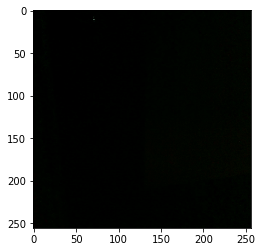

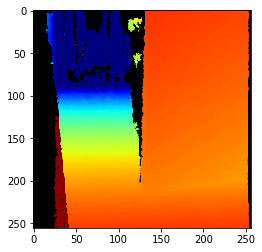

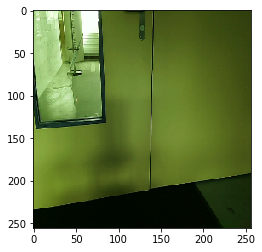

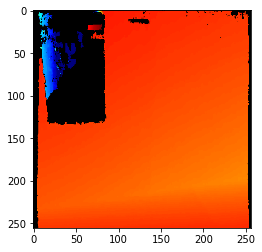

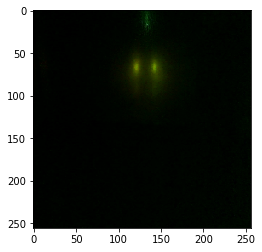

...

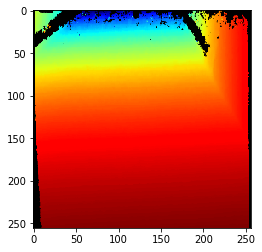

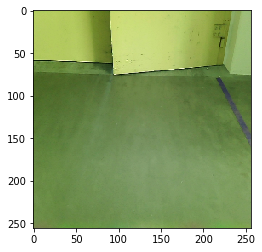

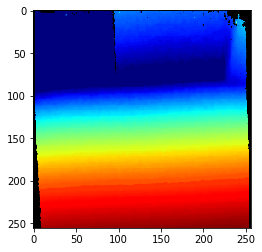

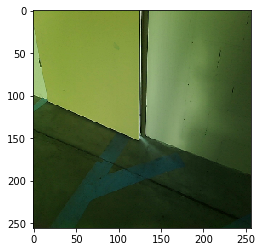

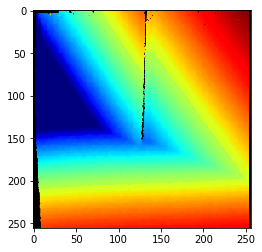

In [78]:
t = 0
labels_wrong = []

for s in scores:
    if not s[0]:
        t+=1
        if s[1][1] == 0:
            labels_wrong.append(0)
        else:
            labels_wrong.append(1)
        plt.imshow(s[2][:, :, :3])
        plt.show()
        plt.imshow(s[2][:, :, 3:])
        plt.show()

(array([115.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,  27.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

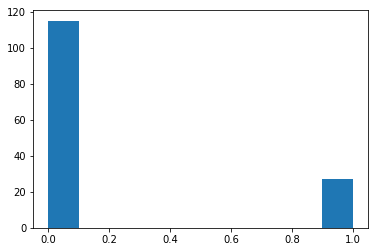

In [81]:
plt.hist(np.array(labels_wrong))